<a href="https://colab.research.google.com/github/dl-colman/exercise-1/blob/main/understanding_backpropagation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Understanding Backpropagation
-----------
Some of the examples were taken from [Math - Differential Calculus](https://colab.research.google.com/github/ageron/handson-ml2/blob/master/math_differential_calculus.ipynb)

<img width= 700px, src="https://miro.medium.com/max/1400/0*4yBZXr0FxJKC6qCm.png">

## Import Libreries

In [1]:
#@title
%matplotlib inline
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import random
import math
mpl.rc('animation', html='jshtml')

## General Explanation

### Slope of a straight line
What is the slope of the following line?

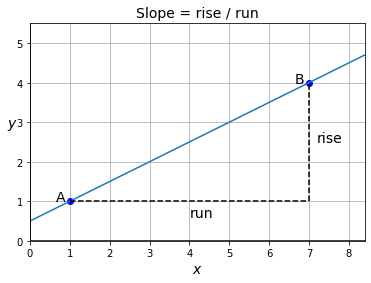

In [2]:
#@title
def get_AB_line(A_pos, B_pos, x_min=-1000, x_max=+1000):
    rise = B_pos[1] - A_pos[1]
    run = B_pos[0] - A_pos[0]
    slope = rise / run
    offset = A_pos[1] - slope * A_pos[0]
    return [x_min, x_max], [x_min * slope + offset, x_max * slope + offset]

def plot_AB_line(A_pos, B_pos, A_name="A", B_name="B"):
    for point, name in ((A_pos, A_name), (B_pos, B_name)):
        plt.plot(point[0], point[1], "bo")
        plt.text(point[0] - 0.35, point[1], name, fontsize=14)
    xs, ys = get_AB_line(A_pos, B_pos)
    plt.plot(xs, ys)

def plot_rise_over_run(A_pos, B_pos):
    plt.plot([A_pos[0], B_pos[0]], [A_pos[1], A_pos[1]], "k--")
    plt.text((A_pos[0] + B_pos[0]) / 2, A_pos[1] - 0.4, "run", fontsize=14)
    plt.plot([B_pos[0], B_pos[0]], [A_pos[1], B_pos[1]], "k--")
    plt.text(B_pos[0] + 0.2, (A_pos[1] + B_pos[1]) / 2, "rise", fontsize=14)

def show(axis="equal", ax=None, title=None, xlabel="$x$", ylabel="$y$"):
    ax = ax or plt.gca()
    ax.axis(axis)
    ax.grid()
    ax.set_title(title, fontsize=14)
    ax.set_xlabel(xlabel, fontsize=14)
    ax.set_ylabel(ylabel, fontsize=14, rotation=0)
    ax.axhline(y=0, color='k')
    ax.axvline(x=0, color='k')

A_pos = np.array([1, 1])
B_pos = np.array([7, 4])
plot_AB_line(A_pos, B_pos)
plot_rise_over_run(A_pos, B_pos)
show([0, 8.4, 0, 5.5], title="Slope = rise / run")

### Defining the slope of a curve
But what if you want to know the slope of something else than a straight line? For example, let's consider the curve defined by $y = f(x) = x^2$:

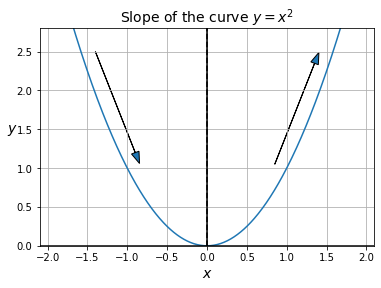

In [3]:
#@title
xs = np.linspace(-2.1, 2.1, 500)
ys = xs**2
plt.plot(xs, ys)

plt.plot([0, 0], [0, 3], "k--")
plt.arrow(-1.4, 2.5, 0.5, -1.3, head_width=0.1)
plt.arrow(0.85, 1.05, 0.5, 1.3, head_width=0.1)
show([-2.1, 2.1, 0, 2.8], title="Slope of the curve $y = x^2$")

### Slope Animation
Obviously, the slope varies: on the left (i.e., when $x<0$), the slope is negative (i.e., when we move from left to right, the curve goes down), while on the right (i.e., when $x>0$) the slope is positive (i.e., when we move from left to right, the curve goes up). At the point $x=0$, the slope is equal to 0 (i.e., the curve is locally flat). The fact that the slope is 0 when we reach a minimum (or indeed a maximum) is crucially important, and we will come back to it later.<br><br>
As you can see, when point $\mathrm{B}$ is very close to point $\mathrm{A}$, the $(\mathrm{AB})$ line becomes almost indistinguishable from the curve itself (at least locally around point $\mathrm{A}$). The $(\mathrm{AB})$ line gets closer and closer to the **tangent** line to the curve at point $\mathrm{A}$: this is the best linear approximation of the curve at point $\mathrm{A}$.

So it makes sense to define the slope of the curve at point $\mathrm{A}$ as the slope that the $\mathrm{(AB)}$ line approaches when $\mathrm{B}$ gets infinitely close to $\mathrm{A}$. This slope is called the **derivative** of the function $f$ at $x=x_\mathrm{A}$. For example, the derivative of the function $f(x)=x^2$ at $x=x_\mathrm{A}$ is equal to $2x_\mathrm{A}$ (we will see how to get this result shortly), so on the graph above, since the point $\mathrm{A}$ is located at $x_\mathrm{A}=-1$, the tangent line to the curve at that point has a slope of $-2$.

In [4]:
#@title
def animate_AB_line(f, fp, f_str, x_A, axis=None):
    y_A = f(x_A)
    eps = 1e-4
    x_B_range = 1.5
    x_B = x_A + eps

    n_frames = 200
    text_offset_A = -0.2
    text_offset_B = +0.1
    x_min, x_max = -1000, 1000

    fig, ax = plt.subplots()

    # plot f(x)
    xs = np.linspace(-2.1, 2.1, 500)
    ys = f(xs)
    ax.plot(xs, ys)

    # plot the tangent to the curve at point A
    if fp:
        slope = fp(x_A)
        offset = y_A - slope * x_A
        ax.plot([x_min, x_max], [slope*x_min + offset, slope*x_max + offset],
                "y--")

    # plot the line AB and the labels A and B so they can be animated
    y_A = f(x_A)
    y_B = f(x_B)
    xs, ys = get_AB_line([x_A, y_A], [x_B, y_B])
    line_inf, = ax.plot(xs, ys, "-")
    line_AB, = ax.plot([x_A, x_B], [y_A, y_B], "bo-")
    ax.text(x_A + text_offset_A, y_A, "A", fontsize=14)
    B_text = ax.text(x_B + text_offset_B, y_B, "B", fontsize=14)

    # plot the grid and axis labels
    title = r"Slope of the curve $y = {}$ at $x_\mathrm{{A}} = {}$".format(f_str, x_A)
    show(axis or [-2.1, 2.1, 0, 2.8], title=title)

    def update_graph(i):
        x_B = x_A + x_B_range * np.cos(i * 2 * np.pi / n_frames) ** 3
        if np.abs(x_B - x_A) < eps:
            x_B = x_A + eps # to avoid division by 0
        y_B = f(x_B)
        xs, ys = get_AB_line([x_A, y_A], [x_B, y_B])
        line_inf.set_data(xs, ys)
        line_AB.set_data([x_A, x_B], [y_A, y_B])
        B_text.set_position([x_B + text_offset_B, y_B])
        return line_inf, line_AB

    anim = animation.FuncAnimation(fig, update_graph,
                                  init_func=lambda: update_graph(0),
                                  frames=n_frames,
                                  interval=20,
                                  blit=True)
    plt.close()
    return anim

animate_AB_line(lambda x: x**2, lambda x: 2*x, "x^2", -1)

### Plotting the tangent to a curve
Let's use the equation $f'(x) = 2x$ to plot the tangent to the $y=x^2$ curve at various values of $x$ (you can click on the play button under the graphs to play the animation):

In [5]:
#@title
def animate_tangent(f, fp, f_str):
    n_frames = 200
    x_min, x_max = -1000, 1000

    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(5, 8), sharex=True)

    # plot f
    xs = np.linspace(-2.1, 2.1, 500)
    ys = f(xs)
    ax1.plot(xs, ys)

    # plot tangent
    line_tangent, = ax1.plot([x_min, x_max], [0, 0])

    # plot f'
    xs = np.linspace(-2.1, 2.1, 500)
    ys = fp(xs)
    ax2.plot(xs, ys, "r-")

    # plot points A
    point_A1, = ax1.plot(0, 0, "bo")
    point_A2, = ax2.plot(0, 0, "bo")

    show([-2.1, 2.1, 0, 2.8], ax=ax1, ylabel="$f(x)$",
        title=r"$y=f(x)=" + f_str + "$ and the tangent at $x=x_\mathrm{A}$")
    show([-2.1, 2.1, -4.2, 4.2], ax=ax2, ylabel="$f'(x)$",
        title=r"y=f'(x) and the slope of the tangent at $x=x_\mathrm{A}$")

    def update_graph(i):
        x = 1.5 * np.sin(2 * np.pi * i / n_frames)
        f_x = f(x)
        df_dx = fp(x)
        offset = f_x - df_dx * x
        line_tangent.set_data([x_min, x_max],
                              [df_dx * x_min + offset, df_dx * x_max + offset])
        point_A1.set_data(x, f_x)
        point_A2.set_data(x, df_dx)
        return line_tangent, point_A1, point_A2

    anim = animation.FuncAnimation(fig, update_graph,
                                  init_func=lambda: update_graph(0),
                                  frames=n_frames,
                                  interval=20,
                                  blit=True)
    plt.close()
    return anim

def f(x):
  return x**2

def fp(x):
  return 2*x

animate_tangent(f, fp, "x^2")

## Our experiment

### Our Function
A convex function that will help us illustrate the behavior of the loss<br><br>
This is our Loss function:
<br>


$f(x) = {x^2 + 2x +3}$

In [6]:
def loss(x):
  return(x**2+2*x+3)

In [7]:
xs = np.arange(-10,10,0.25)
ys = loss(xs)

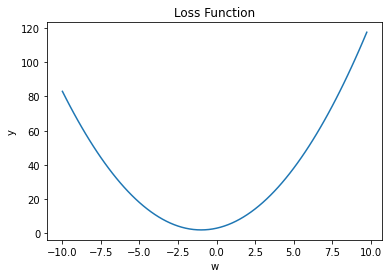

In [8]:
plt.title('Loss Function')
plt.xlabel('w')
plt.ylabel('y')
plt.plot(xs,ys)
plt.show()

The derivative of our Loss function

$\dfrac{\partial y}{\partial x}	= f'(x) = {2x +2}$

In [9]:
def dx_loss(x):
  return(2*x+2)

As you probably know, the slope of a (non-vertical) straight line can be calculated by taking any two points $\mathrm{A}$ and $\mathrm{B}$ on the line, and computing the "rise over run":

$slope = \dfrac{rise}{run} = \dfrac{\Delta y}{\Delta x} = \dfrac{y_\mathrm{B} - y_\mathrm{A}}{x_\mathrm{B} - x_\mathrm{A}}$

Lets try to guess where the global minimum is! 

In [10]:
my_guess = 5

Let's use the derivative to find the slope at the point x = 5

derivative at point x is: 12
val of y at point x is: 38


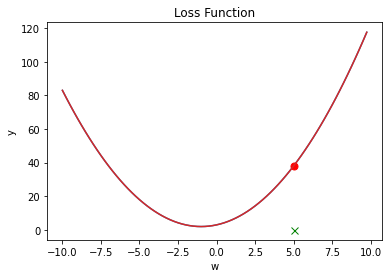

In [11]:
print('derivative at point x is:', dx_loss(my_guess))
print('val of y at point x is:', loss(my_guess))
plt.plot(xs,ys)
plt.plot(my_guess,loss(my_guess), marker="o", markersize=7, markeredgecolor="red", markerfacecolor="red")
plt.plot(my_guess,0, marker="x", markersize=7, markeredgecolor="green", markerfacecolor="red")
plt.title('Loss Function')
plt.xlabel('w')
plt.ylabel('y')
plt.plot(xs,ys)
plt.show()

Now we know that the slope at the point is 12, which is a positive slope. Therefore, we know that in order to get closer to the global minimum, we need to move to the left.

Now my Guess is: -1
derivative at point x is: 0
val of y at point x is: 2


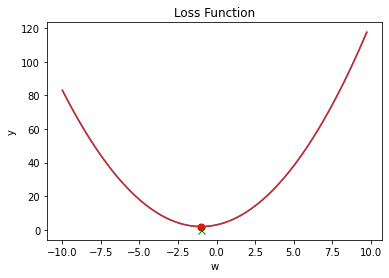

In [12]:
my_guess = my_guess - 6
print('Now my Guess is:', my_guess)
print('derivative at point x is:', dx_loss(my_guess))
print('val of y at point x is:', loss(my_guess))
plt.plot(xs,ys)
plt.plot(my_guess,loss(my_guess), marker="o", markersize=7, markeredgecolor="red", markerfacecolor="red")
plt.plot(my_guess,0, marker="x", markersize=7, markeredgecolor="green", markerfacecolor="red")
plt.title('Loss Function')
plt.xlabel('w')
plt.ylabel('y')
plt.plot(xs,ys)
plt.show()

### By Definition
$f'(x) = \underset{h \to 0}\lim\dfrac{f(x + h) - f(x)}{h}$

In [13]:
h=0.0001
initial_guess = 5

initial Guess is: 5
calc deriv at point x = 5
val of y at point x is: 38
val of y at point x+h is: 38.00120001
derivative at point x is: 12.000099999980307


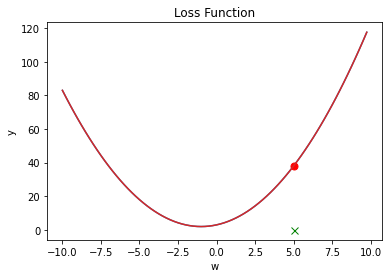

In [14]:
deriv = (loss(initial_guess + h )- loss(initial_guess)) / h
print('initial Guess is:', initial_guess)
print('calc deriv at point x =',initial_guess)
print('val of y at point x is:', loss(initial_guess))
print('val of y at point x+h is:',loss(initial_guess+h))
print('derivative at point x is:', deriv)
plt.plot(xs,ys)
plt.plot(initial_guess,loss(initial_guess), marker="o", markersize=7, markeredgecolor="red", markerfacecolor="red")
plt.plot(initial_guess,0, marker="x", markersize=7, markeredgecolor="green", markerfacecolor="red")
plt.title('Loss Function')
plt.xlabel('w')
plt.ylabel('y')
plt.plot(xs,ys)
plt.show()

### Gradient Decsent
<img src="http://hmkcode.github.io/images/ai/bp_update_formula.png">

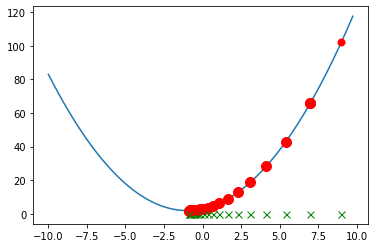

In [15]:
plt.plot(xs,ys)
initial_guess = 9
learningRate = 0.1
deriv = (loss(initial_guess+h)-loss(initial_guess))/h
plt.plot(initial_guess,loss(initial_guess), marker="o", markersize=7, markeredgecolor="red", markerfacecolor="red")
plt.plot(initial_guess,0, marker="x", markersize=7, markeredgecolor="green", markerfacecolor="red")


initial_guess = initial_guess - learningRate * deriv
plt.plot(initial_guess,loss(initial_guess), marker="o", markersize=10, markeredgecolor="red", markerfacecolor="red")

for j in range(20):
  plt.plot(initial_guess,loss(initial_guess), marker="o", markersize=10, markeredgecolor="red", markerfacecolor="red")
  plt.plot(initial_guess,0, marker="x", markersize=7, markeredgecolor="green", markerfacecolor="red")
  deriv = (loss(initial_guess+h)-loss(initial_guess))/h 
  initial_guess = initial_guess - learningRate * deriv
